In [155]:
 import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
%matplotlib inline
from pandas_profiling import ProfileReport
from collections import Counter
from sklearn.preprocessing import StandardScaler
# data splitting
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
# data modeling
from sklearn.metrics import confusion_matrix,accuracy_score,roc_curve,classification_report
from sklearn.linear_model import LogisticRegression

In [2]:
dff=pd.read_csv('framingham.csv')

In [3]:
dff

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4233,1,50,1.0,1,1.0,0.0,0,1,0,313.0,179.0,92.0,25.97,66.0,86.0,1
4234,1,51,3.0,1,43.0,0.0,0,0,0,207.0,126.5,80.0,19.71,65.0,68.0,0
4235,0,48,2.0,1,20.0,NaN,0,0,0,248.0,131.0,72.0,22.00,84.0,86.0,0
4236,0,44,1.0,1,15.0,0.0,0,0,0,210.0,126.5,87.0,19.16,86.0,NaN,0


In [9]:
profile = ProfileReport(dff)
profile.to_notebook_iframe()

In [8]:
#No. for null values in each column
dff.isnull().sum()

male                 0
age                  0
education          105
currentSmoker        0
cigsPerDay          29
BPMeds              53
prevalentStroke      0
prevalentHyp         0
diabetes             0
totChol             50
sysBP                0
diaBP                0
BMI                 19
heartRate            1
glucose            388
TenYearCHD           0
dtype: int64

In [9]:
#mean of each column
dff.mean()

male                 0.429212
age                 49.584946
education            1.978950
currentSmoker        0.494101
cigsPerDay           9.003089
BPMeds               0.029630
prevalentStroke      0.005899
prevalentHyp         0.310524
diabetes             0.025720
totChol            236.721585
sysBP              132.352407
diaBP               82.893464
BMI                 25.802008
heartRate           75.878924
glucose             81.966753
TenYearCHD           0.151958
dtype: float64

In [84]:
#Copying data into new value
df=dff.copy()
df

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4233,1,50,1.0,1,1.0,0.0,0,1,0,313.0,179.0,92.0,25.97,66.0,86.0,1
4234,1,51,3.0,1,43.0,0.0,0,0,0,207.0,126.5,80.0,19.71,65.0,68.0,0
4235,0,48,2.0,1,20.0,NaN,0,0,0,248.0,131.0,72.0,22.00,84.0,86.0,0
4236,0,44,1.0,1,15.0,0.0,0,0,0,210.0,126.5,87.0,19.16,86.0,NaN,0


In [85]:
#interpolating the null values using nearest interpolation method 
df['education']=df['education'].interpolate(method='nearest')
df['cigsPerDay']=df['cigsPerDay'].interpolate(method='nearest')
df['BPMeds']=df['BPMeds'].interpolate(method='nearest')
df['BMI']=df['BMI'].interpolate(method='nearest')
df['heartRate']=df['heartRate'].interpolate(method='nearest')
df['glucose']=df['glucose'].interpolate(method='nearest')

In [86]:
df['totChol']=df['totChol'].interpolate(method='nearest')

In [20]:
#Mean After interpolation
df.mean()

male                 0.429212
age                 49.584946
education            1.981831
currentSmoker        0.494101
cigsPerDay           9.016281
BPMeds               0.029495
prevalentStroke      0.005899
prevalentHyp         0.310524
diabetes             0.025720
totChol            236.755545
sysBP              132.352407
diaBP               82.893464
BMI                 25.793525
heartRate           75.876593
glucose             81.995045
TenYearCHD           0.151958
dtype: float64

In [21]:
#checking if any null value left
df.isnull().sum()

male               0
age                0
education          0
currentSmoker      0
cigsPerDay         0
BPMeds             0
prevalentStroke    0
prevalentHyp       0
diabetes           0
totChol            0
sysBP              0
diaBP              0
BMI                0
heartRate          0
glucose            0
TenYearCHD         0
dtype: int64

In [23]:
#pandas profile
profiles = ProfileReport(df)
profiles

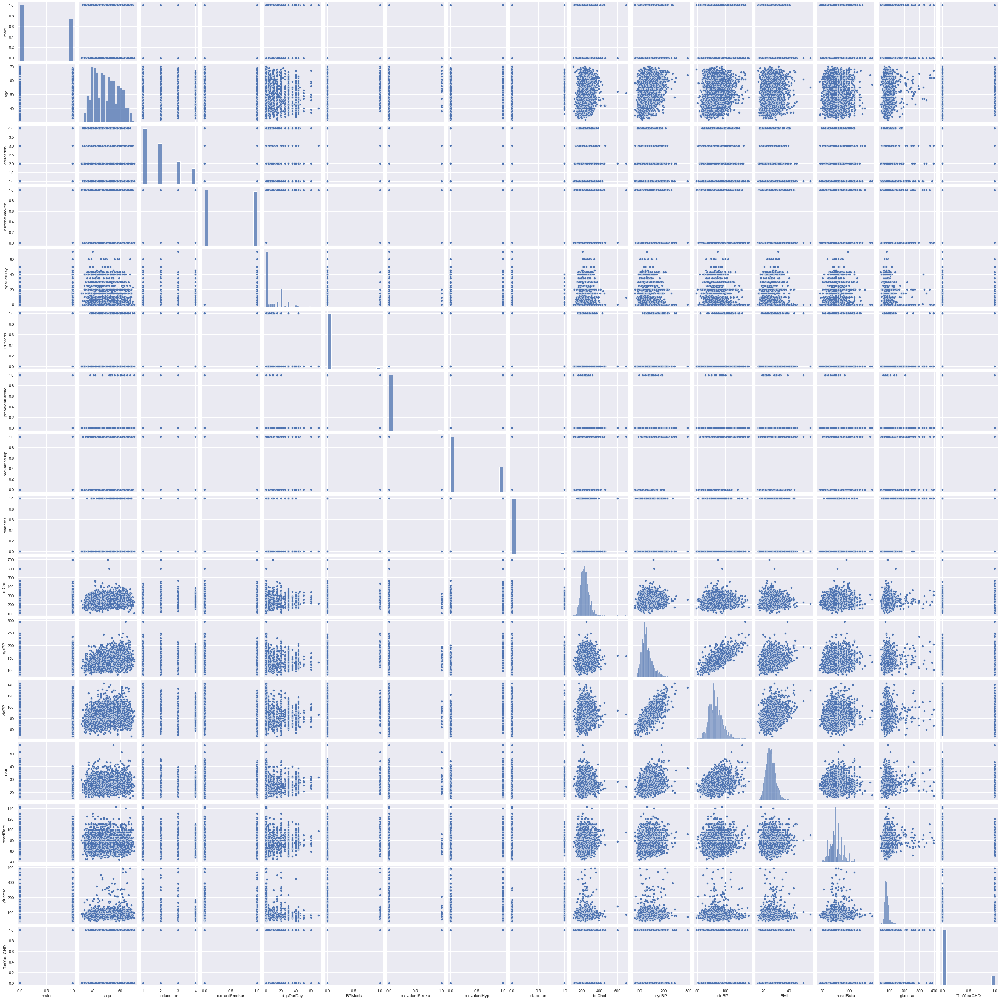

In [33]:
#pairplot

sns.pairplot(df)

<AxesSubplot:>

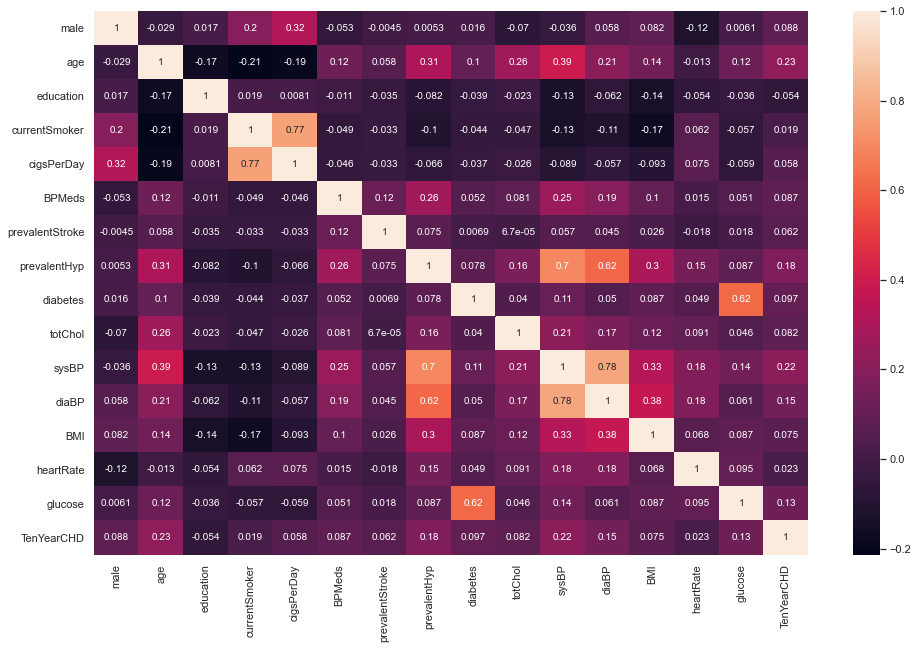

In [39]:
#Heatmaps

plt.figure(figsize = (16,10))
sns.heatmap(dff.corr(), annot = True)

In [50]:
#counting 1's and 0's in TenYearCHD

tc=df['TenYearCHD']
Counter(tc)

Counter({0: 3594, 1: 644})

In [97]:
#Alloting values to Y and X variables

y=df['TenYearCHD']
X=df.drop('TenYearCHD', axis=1)


In [151]:
#train test split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state = 60)

In [152]:
#
scaling= StandardScaler()
X_train =scaling.fit_transform(X_train)
X_test = scaling.transform(X_test)

In [153]:
#logistic Regression , Confussion matrix and Accuracy of of regression

logreg = LogisticRegression()
model = logreg.fit(X_train, y_train)
lr_predict = logreg.predict(X_test)
lr_conf_matrix = confusion_matrix(y_test, lr_predict)
lr_acc_score = accuracy_score(y_test, lr_predict)
print("confussion matrix")
print(lr_conf_matrix)
print("\n")
print("Accuracy of Logistic Regression:",lr_acc_score*100,'\n')
print(classification_report(y_test,lr_predict))

confussion matrix
[[716   0]
 [122  10]]


Accuracy of Logistic Regression: 85.61320754716981 

              precision    recall  f1-score   support

           0       0.85      1.00      0.92       716
           1       1.00      0.08      0.14       132

    accuracy                           0.86       848
   macro avg       0.93      0.54      0.53       848
weighted avg       0.88      0.86      0.80       848



In [156]:
#Kfold cross validation
score=cross_val_score(LogisticRegression(),df.drop('TenYearCHD',axis=1),df['TenYearCHD'],cv=10)
print(f"After k-fold cross validation score is {score.mean()}")

C:\Users\92305\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\92305\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

After k-fold cross validation score is 0.8487488291181589


C:\Users\92305\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\92305\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_